## Summary of the Project

<hr>

### Student Name: Georgios Pipilis

### Mentors: Patrick Peplowski, Sergei Gleyzer, Jason Terry

<hr>

The goal of this project is to contribute towards the creation of an ML pipeline that predicts the relationship between the albedo of Mercury and the chemical composition of its surface. However, there are two main "problems" we must tackle before we start applying ML models.



*   There is a lot of missing data on our Mercury surface datasets, especially around the North pole of the planet.
*   The data we do have was measured by MESSENGER from different distances, due the probe's highly elliptical orbit. This results in Mercury image maps with spatial resolution that varies depending on the coordinates of the pixel we're looking at.

In this notebook:


*   We create an adaptive smoothing algorithm that applies 2D Gaussian convolutions based on real planetary distances (in kilometers) and not pixels. This allows us to go from the 2D map projections of the planets to the 3D spherical representation of them. 
*   We try this algorithm out on the Moon.
*   We apply various ML methods to see how well we can predict the relationship between the albedo and the chemical composition of the lunar surface. The reason we apply all of these on the Moon and not directly on Mercury is because we have no missing information about the Lunar albedo and the corresponding element maps are of high quality. Essentialy, the Moon serves as a benchmark before we get to Mercury.
*   As mentioned above, some of the data on Mercury is missing. We create "masks" based on these areas that have no data. Afterwards, we apply these masks to the lunar surface in order to simulate something we call "Mooncury" - a version of the lunar dataset where there is data missing in a pattern identical to the missing data on Mercury.
*   We apply ML on Mooncury. Essentially we have simulated areas of no data on the moon and we're trying to "fill in the gaps" before we attempt the same thing on Mercury (where the data is actually missing).
*   We create a latitude dependent smoothing algorithm which is an evolution of the adaptive smoothing algorithm and allows to apply Gaussian smoothing of different radii based on the latitude of the pixel.
*   We apply ML on Mercury.

<hr>




Importing all of the necessary modules. My algorithms of choice for this notebook are XGBoost and polynomial regression. I chose XGBoost because it was the top performing model in my original proposal task. I also wanted to use a model that's not based on decision trees, so I went with poly.


## Imports

In [1]:
import os
import re
import cv2
import urllib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import xgboost as xgb 

from sklearn.metrics import *
from skimage.filters import gaussian

Random seed so we can always receive the random numbers.

In [2]:
np.random.seed(42)

Below are some helper functions for printing various graphs, splitting maps and scoring the results. These helper functions are hidden by default in order to save some space.

## Helper functions (collapsed/hidden by default)

In [3]:
#@title
def map_splitter(map_):
    '''Splits input map in two and returns the two halves as FLATTENED dataframes'''
    half_maps = np.hsplit(map_, 2) # split numpy array in two pieces
    left = pd.DataFrame(half_maps[0].flatten()) # we need to flatten each piece in order to process it later on
    right = pd.DataFrame(half_maps[1].flatten()) # turning them into pd.dataframes will help us later on

    return left, right

In [4]:
#@title
def map_scoring(y_test, preds, verbose=True, plots=True):
    '''Returns multiple scoring metrics and plots for lunar ML predictions'''
    
    # define the metrics
    residuals = y_test - preds
    mse = mean_squared_error(y_test, preds)
    rmse = mean_squared_error(y_test, preds, squared = False)
    mae = mean_absolute_error(y_test, preds)
    rsq = r2_score(y_test, preds)

    # verbose = False does not return metric numbers
    if verbose: 
        print("MSE:" + repr(mse))
        print("RMSE:" + repr(rmse))
        print("MAE:" + repr(mae))
        print("r^2:" + repr(rsq))

    # plots = False does not return plots
    if plots:

        # the inputs are flattened so we unflatten them
        predimg = preds.reshape(360, -1) 
        resimg = residuals.values.reshape(360, -1)
        yimg = y_test.values.reshape(360, -1)

        # we want all of our maps to be on the same color scale
        # here, we define the range of this color scale
        plotmin = 0
        plotmax = albedo.max()

        # our plots are going to be on a 1-by-4 grid
        fig, axs = plt.subplots(1, 4, figsize=(30, 5))

        # predicted image
        im0 = axs[0].imshow(preds.reshape(360, -1), vmin = plotmin, vmax = plotmax)
        axs[0].text(0, 0, "Predicted Image", fontsize=15)
        axs[0].autoscale(False)
        fig.colorbar(im0, ax=axs[0])

        # diff between predicted and target image
        im1 = axs[1].imshow(residuals.values.reshape(360, -1), cmap = "seismic", vmin = -0.25, vmax = 0.25) 
        axs[1].text(0, 0, "Diff Predicted and Target Image", fontsize=15)
        axs[1].autoscale(False)
        fig.colorbar(im1, ax=axs[1])

        # target image for reference
        im2 = axs[2].imshow(y_test.values.reshape(360, -1), vmin = plotmin, vmax = plotmax)
        axs[2].text(0, 0, "Target Image", fontsize=15)
        axs[2].autoscale(False)
        fig.colorbar(im2, ax=axs[2])

        # residuals vs fits (WARNING: MIGHT NOT WORK ON GOOGLE COLLAB DUE TO RAM CONSTRAINTS!)
        axs[3].scatter(residuals, preds)
        axs[3].text(axs[3].get_xlim()[0], axs[3].get_ylim()[1], "Residuals vs. Fits", fontsize=15)

        plt.show()

    return mse, rmse, mae, rsq, residuals

In [5]:
#@title
def helper_sigmas(srange, mse, rmse, mae, rsq, residuals):
    '''Helps us visualise how different error metrics change as sigma changes in 
    Gaussian blurring'''
    fig, axs = plt.subplots(1, 5, figsize=(30, 5))

    axs[0].plot(srange, mses)
    axs[0].set_xlabel("Standard deviation σ for the Gaussian kernel")
    axs[0].set_ylabel("Mean Square Error")

    axs[1].plot(srange, rmses)
    axs[1].set_xlabel("Standard deviation σ for the Gaussian kernel")
    axs[1].set_ylabel("Root MSE")

    axs[2].plot(srange, maes)
    axs[2].set_xlabel("Standard deviation σ for the Gaussian kernel")
    axs[2].set_ylabel("Mean Absolute Error")

    axs[3].plot(srange, rsqs)
    axs[3].set_xlabel("Standard deviation σ for the Gaussian kernel")
    axs[3].set_ylabel("R-Squared")

    axs[4].plot(srange, [abs(res) for res in residuals])
    axs[4].set_xlabel("Standard deviation σ for the Gaussian kernel")
    axs[4].set_ylabel("Residuals of the albedos")

    plt.show()

In [6]:
#@title
def helper_ksize(srange, mse, rmse, mae, rsq, residuals):
    '''Helps us visualise how different error metrics change as kernel size
    changes in Gaussian blurring'''
    fig, axs = plt.subplots(1, 5, figsize=(30, 5))

    axs[0].plot(srange, mses)
    axs[0].set_xlabel("Kernel Size")
    axs[0].set_ylabel("Mean Square Error")

    axs[1].plot(srange, rmses)
    axs[1].set_xlabel("Kernel Size")
    axs[1].set_ylabel("Root MSE")

    axs[2].plot(srange, maes)
    axs[2].set_xlabel("Kernel Size")
    axs[2].set_ylabel("Mean Absolute Error")

    axs[3].plot(srange, rsqs)
    axs[3].set_xlabel("Kernel Size")
    axs[3].set_ylabel("R-Squared")

    axs[4].plot(srange, [abs(res) for res in residuals])
    axs[4].set_xlabel("Kernel Size")
    axs[4].set_ylabel("Residuals of the albedos")

    plt.show()

## Adaptive smoothing

The goal is to create a Gaussian smoothing algorithm that takes as input the kernel size in kilometers instead of pixels. Essentially, we want the smoothing radius to be expressed in km distances on the lunar surface and not pixels.

We're using the LOLA albedo map dataset.

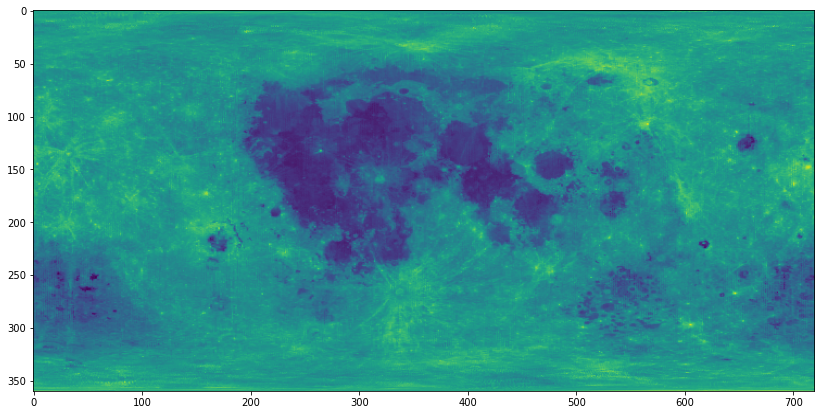

In [7]:
response = urllib.request.urlopen('https://raw.githubusercontent.com/giorgos314/gsoc-2021-mercury-albedo/main/Moon/Lola_Albedo.csv')
lines = [l.decode('utf-8') for l in response.readlines()]

albedo = np.genfromtxt(lines, delimiter=',')
albedo = np.flip(albedo, axis = 0) # the map in the CSV is flipped upside down, so we fix that

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(albedo, aspect='auto')

We're building a numpy array called xy which stores the long and lat value for each pixel of the albedo image.

* xy's shape is (360, 720, 2)
* 0th dimension: y on the albedo image
* 1st dimension: x on the albedo image
* 2nd dimension: [0: long, 1: lat] of that particular pixel of the moon

First we need to create a range of acceptable lat/long values:

In [8]:
x_axis = [np.arange(-180, 180, 0.5)] # 0.5 cause 720/2 = 360
y_axis = [np.arange(90, -90, -0.5)] # -0.5 cause 360/2 = 180
xx, yy = np.meshgrid(x_axis, y_axis, indexing='xy')

Making sure the arrays have the correct shape. The xx array holds the long values for each pixel and the yy array holds the lat values.

In [9]:
np.shape(xx)

(360, 720)

We combine xx and yy into one array:

In [10]:
xy = np.array(list(zip(xx, yy)))
xy = np.moveaxis(xy, 1, -1) # reorder the axes
np.shape(xy)

(360, 720, 2)

Example usage:

In [11]:
xy[150, 150, :] # returns long and lat values for the pixel at position [150, 150] 

array([-105.,   15.])

The idea behind the adaptive blurring function is this:

1.   Calculate the distance (in kilometers) from each pixel to the pixel right next to it
2.   Using these distances, calculate the proper guassian blur radius (in pixels) for each pixel

Essentialy, the algorithm starts at the pixel located at [0, 0] and iterates through all pixels. For each of them it calculates the correct gaussian blur radius based on the kilometers parameter. For example, if we need to blur with a radius of 150 km, the algorithm will calculate how many pixels $p$ correspond to 150km depending on the current lat/long and then apply a gaussian covolution centered around the current pixel with radius = $p$.





We're using Haversine distance in order to calculate the "dimensions" of each pixel in kilometers.

In [12]:
from math import radians, cos, sin, asin, sqrt
def haversine(lat1, lon1, lat2, lon2, radius):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 

    km = radius * c
    return km

In [13]:
print(haversine(90, 0, -90, 0, 1739))
print(haversine(0, -180, 0, 0, 1739)*2)

5463.22962459265
10926.4592491853


Creating an array that, for each pixel, tells us its distance in kilometers from the pixels next to it

In [14]:
# xy's shape is (360, 720, 2)
# 0th dimension: y on the albedo
# 1st dimension: x on the albedo
# 2nd dimension: [0: long, 1: lat]

distances = np.empty((360, 720, 2))

# traverse the entire albedo
for i in range(np.shape(xy)[0]-1): # 0 to 358 in this case (y axis)
    for j in range(np.shape(xy)[1]-1): # 0 to 718 in this case (x axis)
        # calculate pixel height in km using the pixel below the current one
        # reminder: haversine(lat1, lon1, lat2, lon2, radius)
        distances[i, j, 1] = haversine(xy[i, j, 1], xy[i, j, 0], xy[i+1, j, 1], xy[i+1, j, 0], 1739)
        # calculate pixel width in km using the pixel to the right of the current one
        distances[i, j, 0] = haversine(xy[i, j, 1], xy[i, j, 0], xy[i, j+1, 1], xy[i, j+1, 0], 1739)

# the method above fails to calculate values for the last row and last column
# we do that here:

# fixing the last row
for j in range(np.shape(xy)[1]): # 0 to 719 in this case (x axis)       
    distances[-1, j, 1] = haversine(xy[-1, j, 1], xy[-1, j, 0], xy[-2, j, 1], xy[-2, j, 0], 1739)

# fixing the last column
for i in range(np.shape(xy)[0]): # 0 to 359 in this case (y axis)
    distances[i, -1, 0] = haversine(xy[i, -1, 1], xy[i, -1, 0], xy[i, -2, 1], xy[i, -2, 0], 1739)

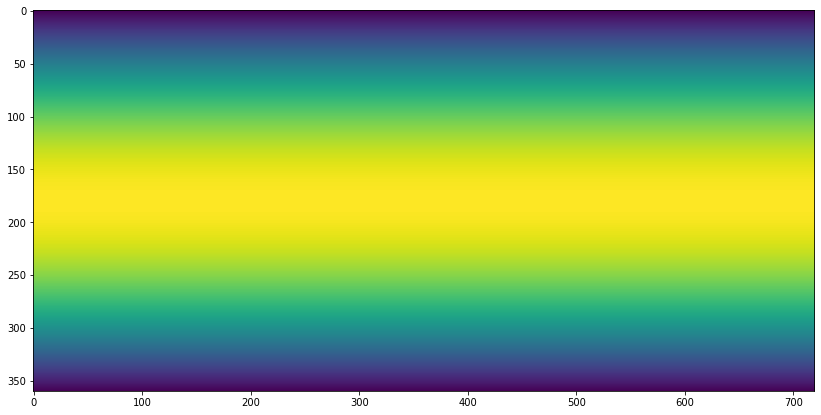

In [15]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(distances[:,:,0], aspect='auto')

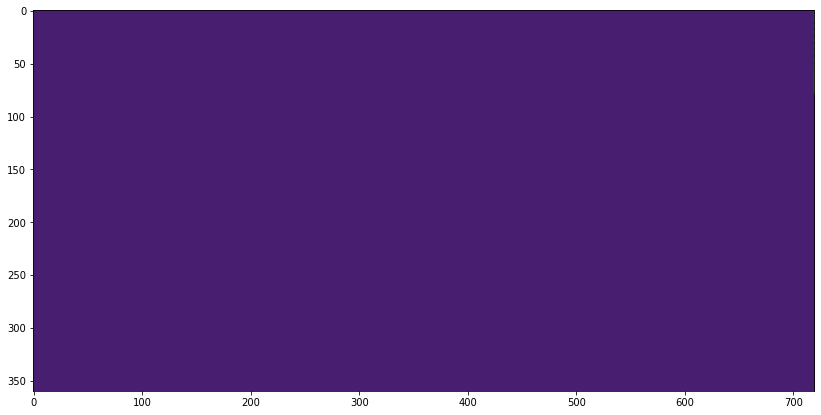

In [16]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(distances[:,:,1], aspect='auto')

We notice that only one of the coordinates affects the pixel size in kilometers. That makes sense since the "distortion" of the map changes depending on our latitude but remains the same if we move only across the X axis.

Functions for turning km distances to pixels and for creating gaussian filters:

In [18]:
import math

# diastances' shape is (360, 720, 2)
# 0th dimension: y on the albedo
# 1st dimension: x on the albedo
# 2nd dimension: [0: dist long, 1: dist lat]

def km_to_radius_x(km, x, y):
    '''Turns distances in km to distances in pixels'''
    # the reason this function is bounded to 360 is that the values for radius
    # on the poles go to infinity and break the algorithm
    if y == 0 or y == 359: return 360
    distance = distances[y, x, 0] 
    increment = int(km/distance) 
    
    return increment if increment < 360 else 360


def create_filter_2d_sep(radius, sigma):
    '''Create a 2D gaussian filter using the separabily property of the Gaussian kernel'''
    gauss = np.empty([2*radius+1, 1])
    center = int(radius)
    
    for pixel in range(2*radius+1):
    # Create a 1D matrix which essentialy is the Gaussian blur in one dimension
        x = abs(center-pixel)
        gaussian = (1/(math.sqrt(2*math.pi*sigma**2))) * (math.e ** ((-x**2)/(2*(sigma**2))))
        gauss[pixel] = gaussian

    # Inner product of the matrix with its transpose is mathematically equivalent
    # to the 2D gaussian kernel but executes faster
    gauss2d = gauss @ gauss.T

    return gauss2d/np.sum(gauss2d)

Before we create our adaptive blurring function, we need to deal with how the kernel functions at the edges of the map. In order to create a proper wrap-around effect we create a grid of maps, as shown below. The next code cell is just for demonstration purposes and doesn't contribute to the functionality of the algorithm.

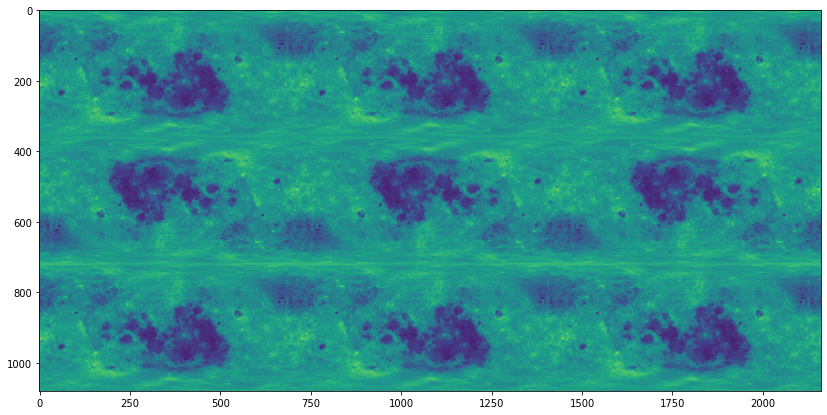

In [19]:
alb_pad = np.flip(albedo, axis = 0)
alb_pad = np.flip(alb_pad, axis = 1)
padding = np.concatenate((alb_pad, alb_pad, alb_pad), axis=1)

layer2 = np.concatenate((albedo, albedo, albedo), axis=1)

newimg = np.concatenate((padding, layer2, padding), axis=0)

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(newimg, aspect='auto')

We make all of our computations on the central map of the grid. When we work with pixels close to the left and right edges of the central image, it's easy to wrap around to the other side. But, when doing so on the poles, we need to wrap around to the same side of the image (since, for example, the other side of the planet's North pole is still on the top of the image). That's why the maps on the first and third row are flipped and mirrored.

In [20]:
def adaptive_gauss(km, img):
    '''Adaptive gaussian blurring'''
    lat, lon = np.shape(img)
    fail = []
    radii = []
    sigmas = []

    # creating the grid of maps
    alb_pad = np.flip(img, axis = 0)
    alb_pad = np.flip(alb_pad, axis = 1)
    padding = np.concatenate((alb_pad, alb_pad, alb_pad), axis=1)

    layer2 = np.concatenate((img, img, img), axis=1)

    alb = np.concatenate((padding, layer2, padding), axis=0)

    xpad = lon
    ypad = lat

    for y in range(ypad, ypad+lat):
        radius = km_to_radius_x(km, 15, y-ypad)
        # sigma is calculated based on radius
        sigma = (radius-1)/2 if radius > 1 else 0.5
        sigma = 20 if sigma > 20 else sigma
        radii.append(radius)
        sigmas.append(sigma)
        # print(y, radius, sigma)
        filter = create_filter_2d_sep(radius, sigma)

        for x in range(xpad, xpad+lon):

            # selecting the pixels we want from the map and the filter
            uplim = y-radius
            downlim = y+radius+1
            leftlim = x-radius
            rightlim = x+radius+1

            fuplim = 0
            fdownlim = 2*radius+1
            fleftlim = 0
            frightlim = 2*radius+1         

            a = alb[uplim:downlim, leftlim:rightlim]
            b = filter[fuplim:fdownlim, fleftlim:frightlim]
            try:
                # applying the kernel
                img[y-ypad, x-xpad] = np.sum(np.multiply(a, b))
            except Exception as e:
                if y not in fail: fail.append(y)
                print(e)
                #print(y, x, np.shape(a), np.shape(b))

    if fail: print(fail)
    return img, radii, sigmas            

Testing for a radius in km = 120

In [21]:
alb_test = np.array(albedo, copy=True)  
test, radii, sigmas = adaptive_gauss(120, alb_test)

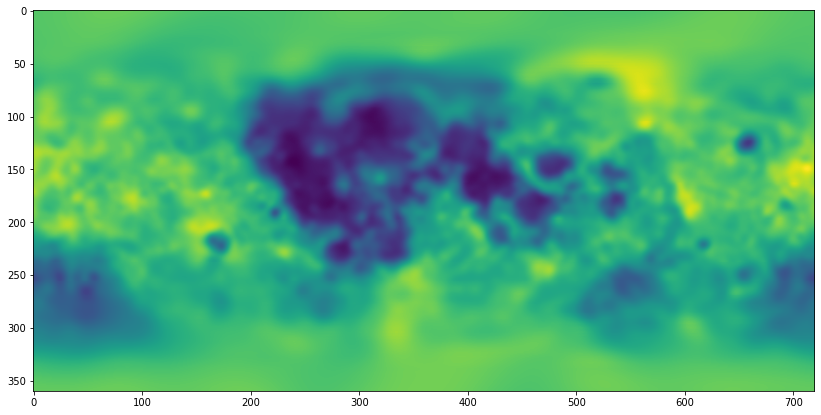

In [22]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(test, aspect='auto')

Plotting the average color per row of pixels before and after the smoothing:

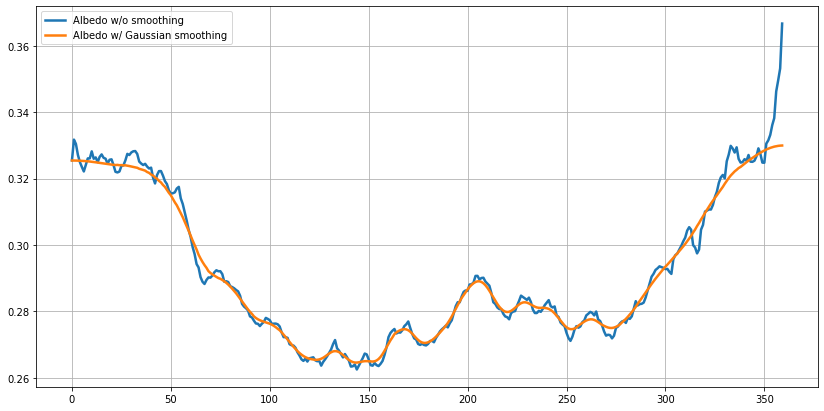

In [23]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.plot([x.mean() for x in albedo[:][:]], linewidth=2.5)
ax.plot([x.mean() for x in test[:][:]], linewidth=2.5)
ax.legend(["Albedo w/o smoothing", "Albedo w/ Gaussian smoothing"])
ax.grid()

The way it looks makes sense, since the top and bottom of the map are the poles. So it makes sense for them to turn into a uniform-ish color. 

For $r$ = 20km

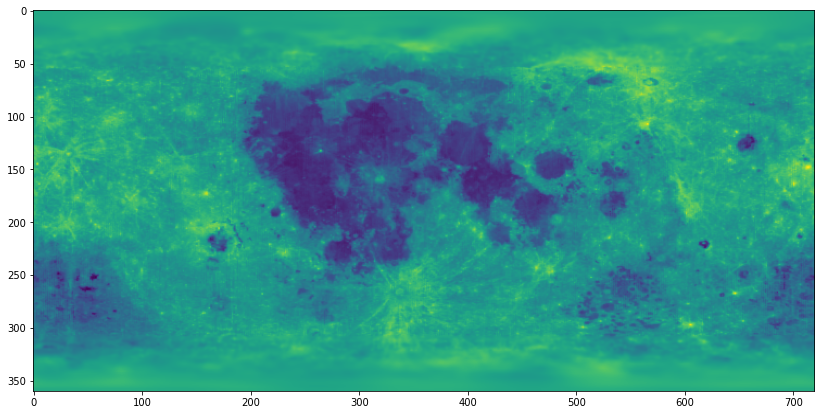

In [24]:
alb_test = np.array(albedo, copy=True)  
test = adaptive_gauss(20, alb_test)[0]

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(test, aspect='auto')

Plotting the change of the radius (in pixels) in relation to the latitude of the pixel

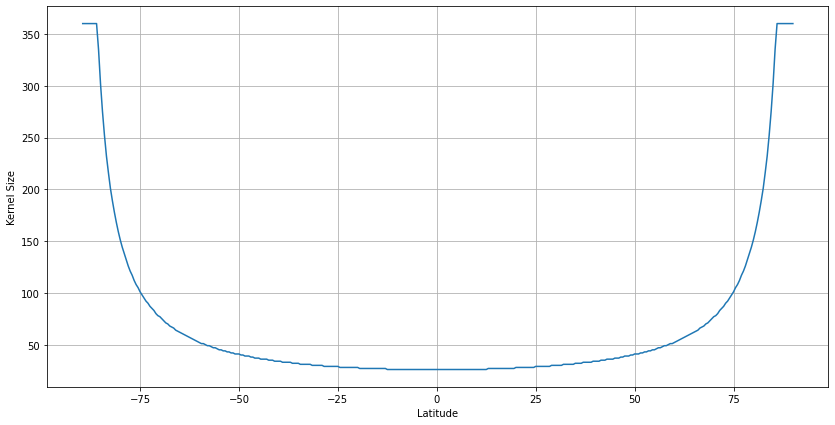

In [25]:
radii = []

for y in range(360):
    radius = km_to_radius_x(400, 250, y)
    radii.append(radius)

fig, ax = plt.subplots(figsize=(14, 7))
plt.ylabel("Kernel Size")
plt.xlabel("Latitude")
plt.grid()
ax.plot(np.arange(90, -90, -0.5), radii)

## Preparing the moon data

Loading Moon's element maps:

In [26]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

moon = {} # storing the maps in a dictionary of numpy arrays

for m in maps:
    response = urllib.request.urlopen('https://raw.githubusercontent.com/giorgos314/gsoc-2021-mercury-albedo/main/Moon/' + m + '_Map.csv')
    lines = [l.decode('utf-8') for l in response.readlines()]
    moon[m] = np.genfromtxt(lines, delimiter=',')

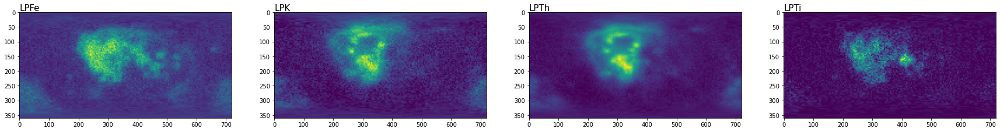

In [27]:
fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))

for m in range(len(maps)):
    axs[m].imshow(moon[maps[m]]) # display the map
    axs[m].text(0, -5, maps[m], fontsize=15) # display a label over the map

plt.show()

Splitting everything into train and test. The `map_splitter` method used, is one of my custom helper functions that are defined above.

In [28]:
X_train = pd.DataFrame()
X_test = pd.DataFrame()

for m in maps:
    left, right = map_splitter(moon[m]) # split and flatten each map
    X_train = pd.concat([X_train, left], axis = 1)
    X_test = pd.concat([X_test, right], axis = 1)

X_train.columns = maps
X_test.columns = maps
X_train

,LPFe,LPK,LPTh,LPTi
0,4.04409,788.81,1.26750,0.190154
1,4.04409,788.81,1.26750,0.190154
2,4.04409,788.81,1.26750,0.190154
3,4.04409,788.81,1.26750,0.190154
4,4.04409,788.81,1.26750,0.190154
...,...,...,...,...
129595,3.82753,455.07,0.79856,0.112137
129596,3.82753,455.07,0.79856,0.112137
129597,3.82753,455.07,0.79856,0.112137
129598,3.82753,455.07,0.79856,0.112137


## Experiments where radius = pixels

I'm using the `GaussianBlur` method from the `cv2` module. First, I plot different values of σ (sigma) against different metrics. Once I find the value where the plot "plateaus", I use that value of sigma to calculate the optimal kernel size. Essentially, I'm using these plots like elbow plots.

In [29]:
mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)
xgb_reg = xgb.XGBRegressor(objective ='reg:squarederror', learning_rate = 0.1, n_estimators = 30, max_depth = 5)

srange = [x/10 for x in range(2, 100, 2)]
for s in srange:
    alb = cv2.GaussianBlur(albedo, (0, 0), s)
    y_trains, y_tests = map_splitter(alb) 
    xgb_reg.fit(X_train, np.ravel(y_trains))
    pred = xgb_reg.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

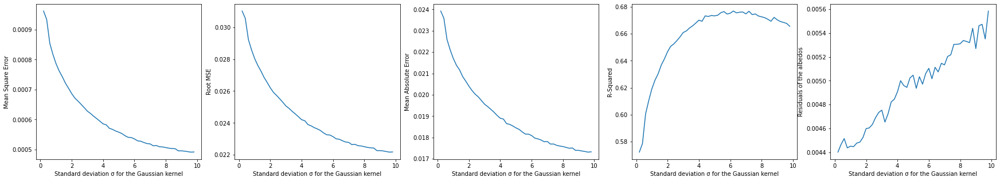

In [30]:
helper_sigmas(srange, mses, rmses, maes, rsqs, residuals)

The best value for sigma seems to be 5. Below, I'm searching for the optimal value of the kernel size for σ=5.

In [31]:
mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)
xgb_reg = xgb.XGBRegressor(objective ='reg:squarederror', learning_rate = 0.1, n_estimators = 30, max_depth = 5)

srange = [x for x in range(1, 100, 2)]
for s in srange:
    alb = cv2.GaussianBlur(albedo, (s, s), 5)
    y_trains, y_tests = map_splitter(alb) 
    xgb_reg.fit(X_train, np.ravel(y_trains))
    pred = xgb_reg.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

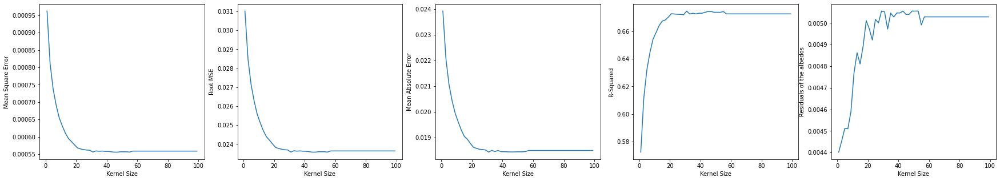

In [32]:
helper_ksize(srange, mses, rmses, maes, rsqs, residuals)

Running the same experiment again but with a shorter range of values.

In [33]:
mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)
xgb_reg = xgb.XGBRegressor(objective ='reg:squarederror', learning_rate = 0.1, n_estimators = 30, max_depth = 5)

srange = [x for x in range(11, 40, 2)]
for s in srange:
    alb = cv2.GaussianBlur(albedo, (s, s), 5)
    y_trains, y_tests = map_splitter(alb) 
    xgb_reg.fit(X_train, np.ravel(y_trains))
    pred = xgb_reg.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

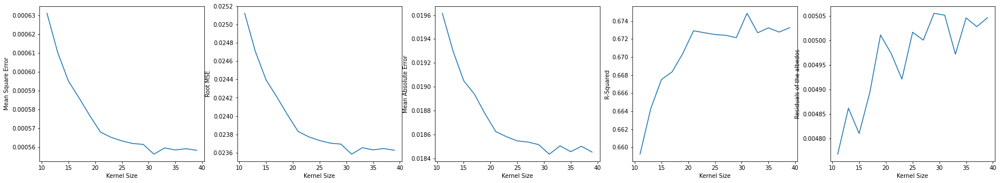

In [34]:
helper_ksize(srange, mses, rmses, maes, rsqs, residuals)

MSE:0.0009698319942023454
RMSE:0.031142125717464206
MAE:0.024037428394097973
r^2:0.5687926583565348


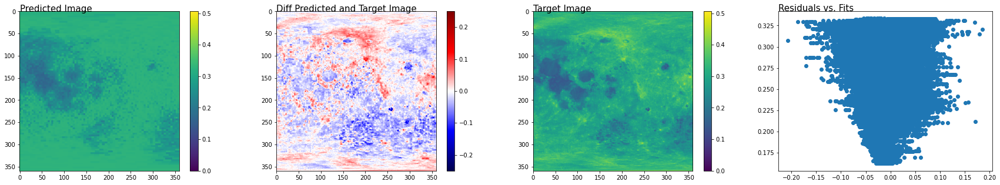

In [35]:
y_trains, y_tests = map_splitter(albedo) 
map_scoring(y_test, pred.reshape(-1, 1));

MSE:0.0005590588101547927
RMSE:0.023644424504622494
MAE:0.018467258473264754
r^2:0.6731395681105473


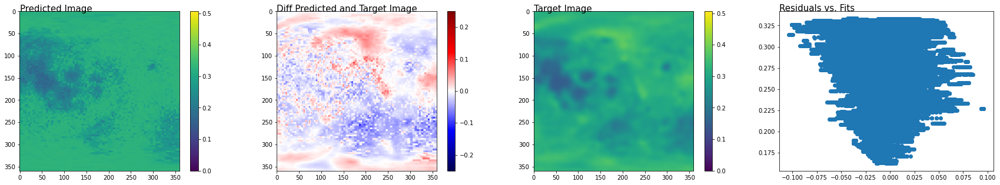

In [36]:
alb = cv2.GaussianBlur(albedo, (31, 31), 5)
y_trains, y_tests = map_splitter(alb) 
map_scoring(y_tests, pred.reshape(-1, 1));

Our metrics have improved. Also, the difference between target and predicted image doesn't have clear features but looks more like noise than anything else. Next, I'll repeat the same experiments for polynomial regression. I did some grid search CV in a local environment and determined that the best poly degree is 2.

In [37]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

pipe = Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression())])

mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)

srange = [x/10 for x in range(2, 100, 2)]
for s in srange:
    alb = cv2.GaussianBlur(albedo, (0, 0), s)
    y_trains, y_tests = map_splitter(alb) 
    pipe.fit(X_train, np.ravel(y_trains))
    pred = pipe.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

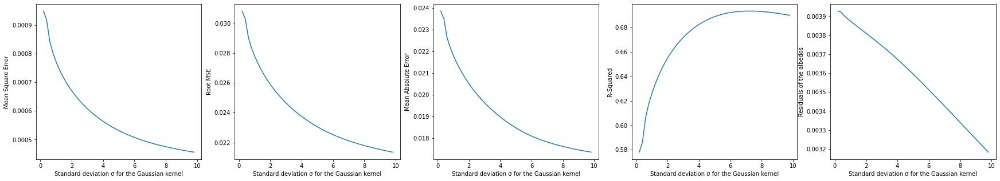

In [38]:
helper_sigmas(srange, mses, rmses, maes, rsqs, residuals)

In [39]:
mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)

pipe = Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression())])

srange = [x for x in range(11, 40, 2)]
for s in srange:
    alb = cv2.GaussianBlur(albedo, (s, s), 5)
    y_trains, y_tests = map_splitter(alb) 
    pipe.fit(X_train, np.ravel(y_trains))
    pred = pipe.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

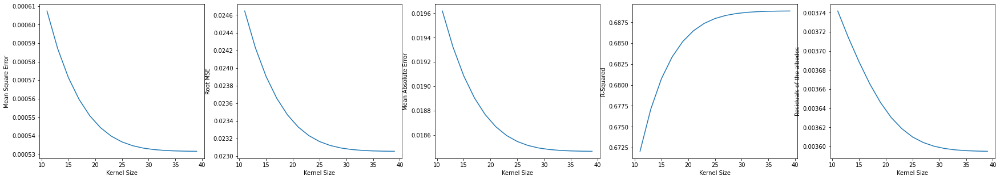

In [40]:
helper_ksize(srange, mses, rmses, maes, rsqs, residuals)

MSE:0.0009464541049784104
RMSE:0.030764494225948368
MAE:0.023805072154048406
r^2:0.5791869508997288


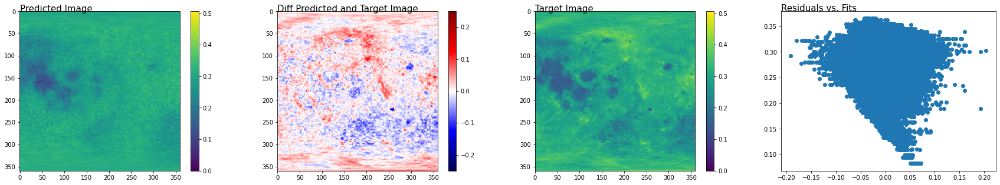

In [41]:
y_trains, y_tests = map_splitter(albedo) 
map_scoring(y_tests, pred.reshape(-1, 1));

## Best result when radius = pixels

MSE:0.0005324020846172776
RMSE:0.02307383983253064
MAE:0.018479305115882944
r^2:0.688724742091686


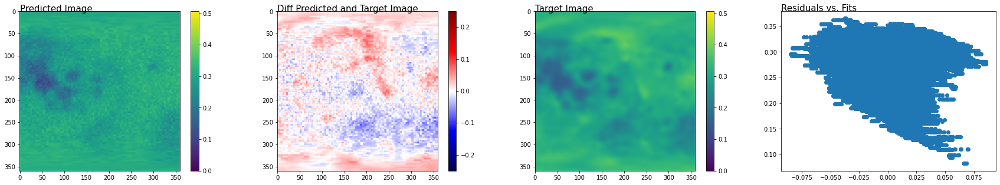

In [42]:
alb = cv2.GaussianBlur(albedo, (31, 31), 5)
y_trains, y_tests = map_splitter(alb) 
map_scoring(y_tests, pred.reshape(-1, 1));

## Experiments where radius = km

Now we'll repeat the same experiments but with the adaptive blurring algorithm.

In [43]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

pipe = Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression())])

mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)

kmrange = range(10, 500, 10)

for km in kmrange:
    alb_test = np.array(albedo, copy=True)  
    alb = adaptive_gauss(km, alb_test)[0]

    y_trains, y_tests = map_splitter(alb) 
    pipe.fit(X_train, np.ravel(y_trains))
    pred = pipe.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

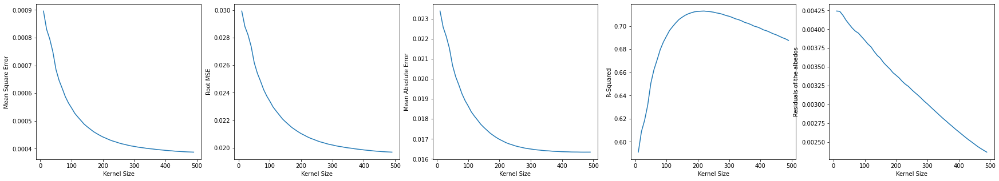

In [44]:
helper_ksize(kmrange, mses, rmses, maes, rsqs, residuals)

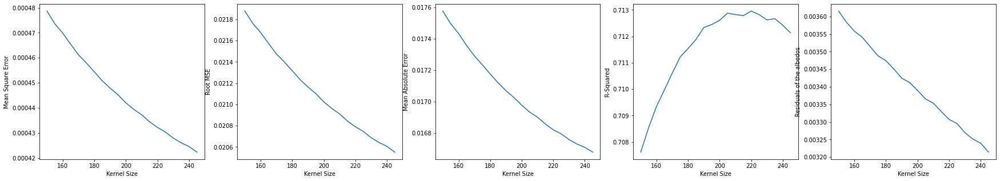

In [45]:
pipe = Pipeline([('poly', PolynomialFeatures(degree=2)),
                  ('linear', LinearRegression())])

mses, rmses, maes, rsqs, residuals = ([] for i in range(5))

y_train, y_test = map_splitter(albedo)

kmrange = range(150, 250, 5)

for km in kmrange:
    alb_test = np.array(albedo, copy=True)  
    alb = adaptive_gauss(km, alb_test)[0]

    y_trains, y_tests = map_splitter(alb) 
    pipe.fit(X_train, np.ravel(y_trains))
    pred = pipe.predict(X_test)
    mse, rmse, mae, rsq, residual = map_scoring(y_tests, pred.reshape(-1, 1), verbose=False, plots=False)

    mses.append(mse)
    rmses.append(rmse)
    maes.append(mae)
    rsqs.append(rsq)
    residuals.append(residual.mean())

helper_ksize(kmrange, mses, rmses, maes, rsqs, residuals)

## Best result when radius = km

MSE:0.00039186844015616116
RMSE:0.019795667206643
MAE:0.015907214524607086
r^2:0.7165567731459089


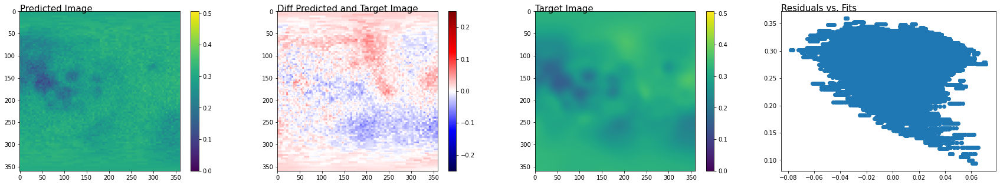

In [46]:
alb = adaptive_gauss(150, alb_test)[0]
y_trains, y_tests = map_splitter(alb) 
map_scoring(y_tests, pred.reshape(-1, 1));

## Mercury Masks

Loading all necessary mercury files:

In [47]:
from itertools import chain

maps = ['mgsimap', 'alsimap', 'ssimap', 'fesimap', 'casimap']
merc_albedo = ['mercury-albedo-resized-bottom-half', 'mercury-albedo-top-half']

mercury = {} # storing the maps in a dictionary of numpy arrays

for m in chain(maps, merc_albedo):
    response = urllib.request.urlopen('https://raw.githubusercontent.com/giorgos314/gsoc-2021-mercury-albedo/main/Mercury/' + m + '.csv')
    lines = [l.decode('utf-8') for l in response.readlines()]
    mercury[m] = np.genfromtxt(lines, delimiter=',')

Displaying the maps:

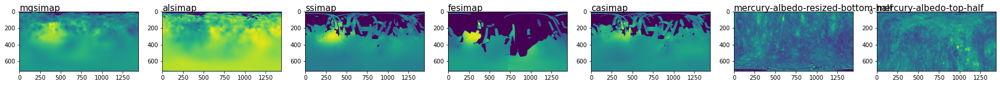

In [48]:
maps = list(mercury.keys())
fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))

for m in range(len(maps)):
    axs[m].imshow(mercury[maps[m]])
    axs[m].text(0, -5, maps[m], fontsize=15)

plt.show()

A better visualisation of which map areas are missing:

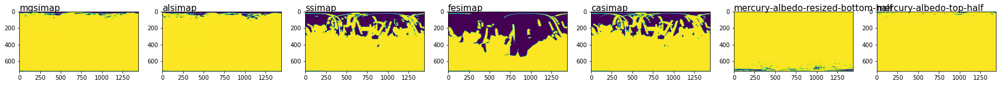

In [49]:
fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))


for m in range(len(maps)):
    axs[m].imshow(np.where(mercury[maps[m]]==0, -100, mercury[maps[m]]))
    axs[m].text(0, -5, maps[m], fontsize=15)

plt.show()

Creating masks from said areas:

In [50]:
masks = {}

for m in range(len(maps)):
    # the albedo maps and the element maps need to have the same dimensions, hence the resizing
    stretched_map = np.repeat(mercury[maps[m]],2, axis=0)
    masks[maps[m]] = np.array([stretched_map == 0])[0,:,:]

masks

{'alsimap': array([[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]]),
 'casimap': array([[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]]),
 'fesimap': array([[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ Tr

We'll create two masks:
- One where _any_ of the element maps are missing data
- One where _all_ of the element maps are missing data

In [51]:
a = np.logical_and(masks['fesimap'], masks['ssimap'])
b = np.logical_and(masks['alsimap'], a)
c = np.logical_and(masks['mgsimap'], b)
d = np.logical_and(masks['casimap'], c)

final_mask_and_full = d

In [52]:
np.shape(final_mask_and_full)

(1440, 1440)

In [53]:
final_mask_and = final_mask_and_full[:720,:]
np.shape(final_mask_and)

(720, 1440)

In [54]:
masked = np.ma.array(mercury['mercury-albedo-top-half'], mask = final_mask_and)

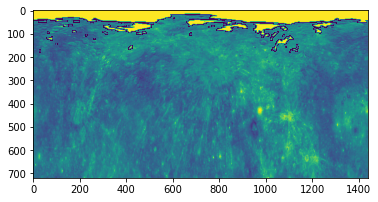

In [55]:
plt.imshow(final_mask_and)
plt.imshow(masked)

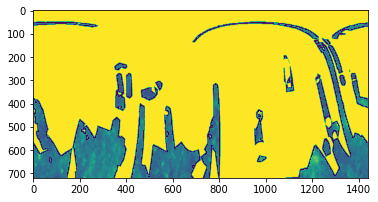

In [56]:
a = np.logical_or(masks['fesimap'], masks['ssimap'])
b = np.logical_or(masks['alsimap'], a)
c = np.logical_or(masks['mgsimap'], b)
d = np.logical_or(masks['casimap'], c)

final_mask_or_full = d
final_mask = final_mask_or_full[:720,:]
masked = np.ma.array(mercury['mercury-albedo-top-half'], mask = final_mask)
plt.imshow(final_mask)
plt.imshow(masked)

In [57]:
print(np.shape(final_mask))
print(np.shape(albedo))

(720, 1440)
(360, 720)


## Mooncury

Mooncury is a term we made up to refer to a version of the lunar maps with mercury's masks applied on them.

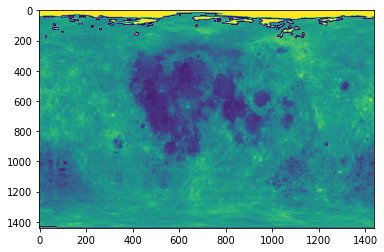

In [58]:
albedo_resized = np.repeat(albedo, 2, axis=1)
albedo_resized = np.repeat(albedo_resized, 4, axis=0)
plt.imshow(albedo_resized)
np.shape(albedo_resized)

masked = np.ma.array(albedo_resized, mask = final_mask_and_full)
plt.imshow(final_mask_and_full, aspect='auto')
plt.imshow(masked, aspect='auto')

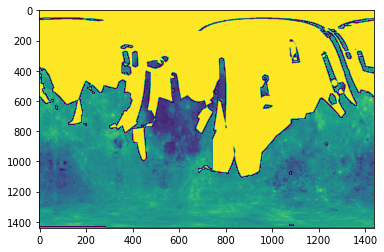

In [59]:
masked = np.ma.array(albedo_resized, mask = final_mask_or_full)
plt.imshow(final_mask_or_full, aspect='auto')
plt.imshow(masked, aspect='auto')

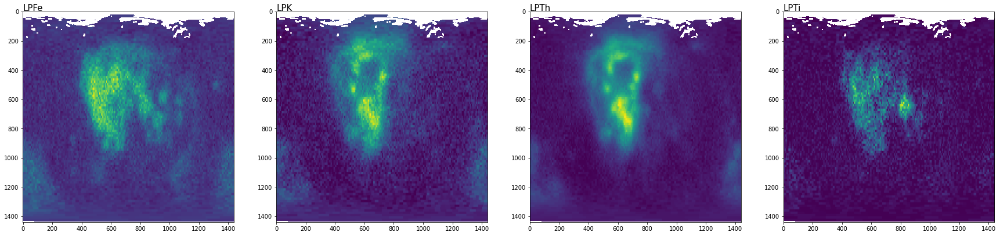

In [60]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))

for m in range(len(maps)):
    mapp = np.repeat(moon[maps[m]], 2, axis=1)
    mapp = np.repeat(mapp, 4, axis=0)
    axs[m].imshow(np.ma.array(mapp, mask = final_mask_and_full)) # display the map
    axs[m].text(0, -5, maps[m], fontsize=15) # display a label over the map

plt.show()

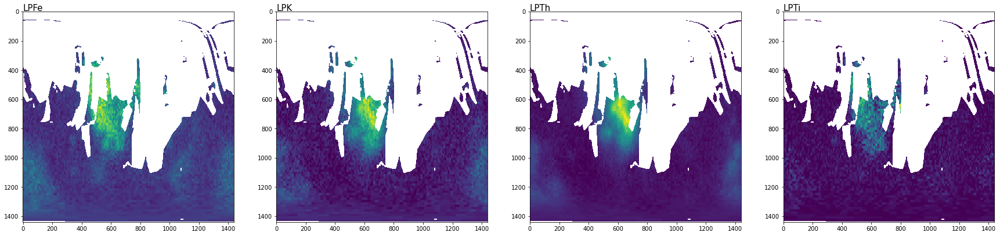

In [61]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))

for m in range(len(maps)):
    mapp = np.repeat(moon[maps[m]], 2, axis=1)
    mapp = np.repeat(mapp, 4, axis=0)
    axs[m].imshow(np.ma.array(mapp, mask = final_mask_or_full)) # display the map
    axs[m].text(0, -5, maps[m], fontsize=15) # display a label over the map

plt.show()

## Lat dependent smoothing

Next, we'll use a version of the algorithm that performs lunar smoothing in order to perform latitude dependent smoothing on mercury.

First, we load the data:

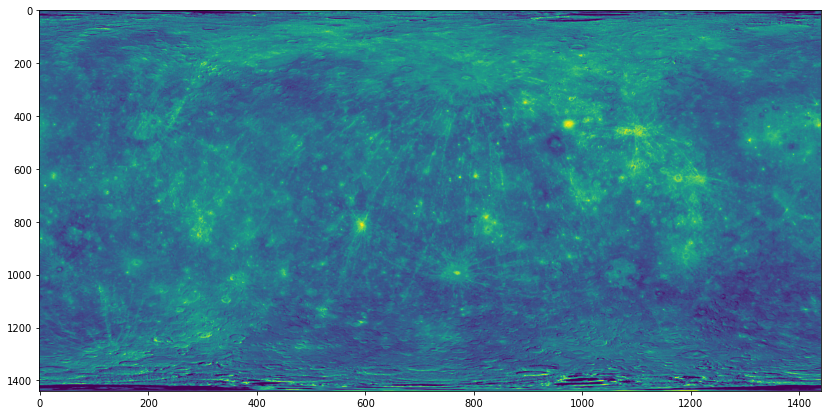

In [62]:
fullmerc = np.vstack([mercury['mercury-albedo-top-half'], mercury['mercury-albedo-resized-bottom-half']])

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(fullmerc, aspect='auto')

We also need the data from the following map. We care about the latitude dependent average spatial resolution (the continuous plot on the far right).

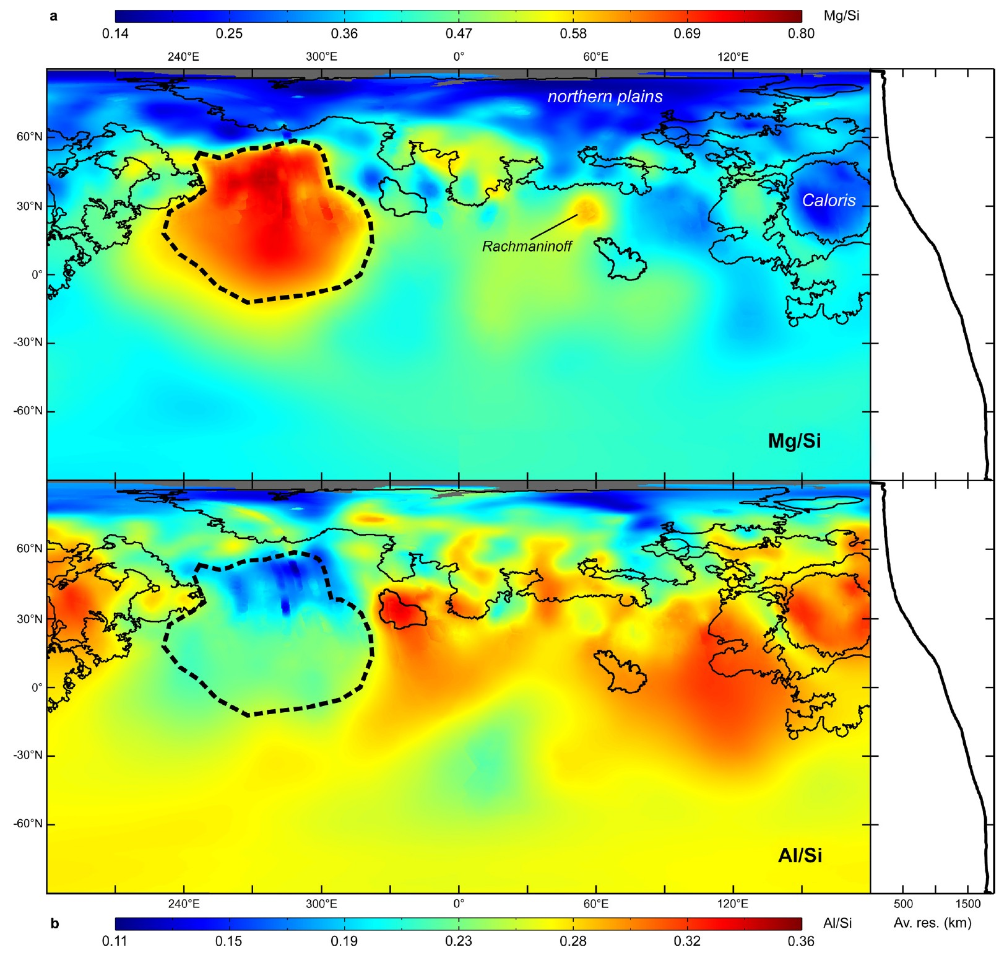

After extracting the data from this plot using computer vision tools, we have the following files that we import:

In [63]:
avgres = pd.read_csv('avgres3.csv', delimiter=',', index_col=0, names=['avgres'])
avgres

,avgres
1,31.73023
2,127.62668
3,202.88701
4,202.88701
5,220.16695
...,...
716,1766.72091
717,1784.00084
718,1784.00084
719,1792.64081


We check to see if the data shape matches the plot from earlier:

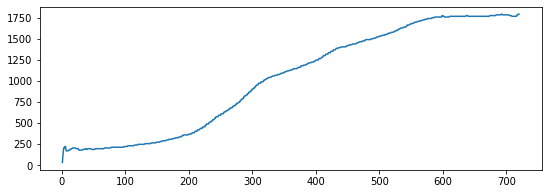

In [64]:
plt.figure(figsize=(9,3))
plt.plot(avgres.index, avgres['avgres'])

Stretching the data for images of 1440 rows (aka for Mercury)

          avgres
0       31.73023
1       31.73023
2      127.62668
3      127.62668
4      202.88701
...          ...
1435  1784.00084
1436  1792.64081
1437  1792.64081
1438  1792.64081
1439  1792.64081

[1440 rows x 1 columns]


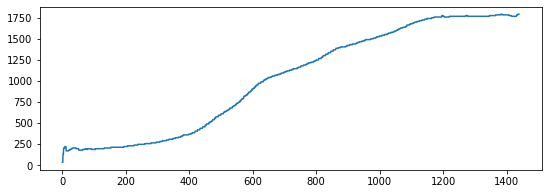

In [65]:
avgres1440 = pd.DataFrame(avgres['avgres'].repeat(2).reset_index())
avgres1440.drop(['index'], axis=1, inplace=True)
print(avgres1440)

plt.figure(figsize=(9,3))
plt.plot(avgres1440.index, avgres1440['avgres'])

Doing the same for images of 360 rows (aka for the Moon)

,avgres
0,79.678455
1,202.887010
2,220.166950
3,168.327150
4,168.327150
...,...
355,1766.720910
356,1766.720910
357,1766.720910
358,1784.000840


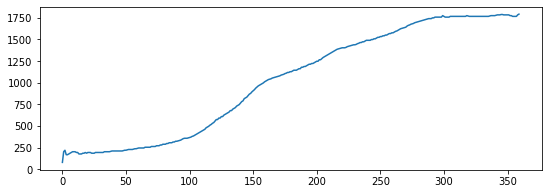

In [66]:
av = avgres['avgres']
avgres360 = ((av + av.shift(-1)) / 2)[::2]
avgres360 = pd.DataFrame(avgres360).reset_index()
avgres360.drop('index', axis=1, inplace=True)
display(avgres360)

plt.figure(figsize=(9,3))
plt.plot(avgres360.index, avgres360['avgres'])

Similarly to how we did for the moon, we calculate the size of all image pixels in kilometers

(1440, 1440)
(1440, 1440, 2)


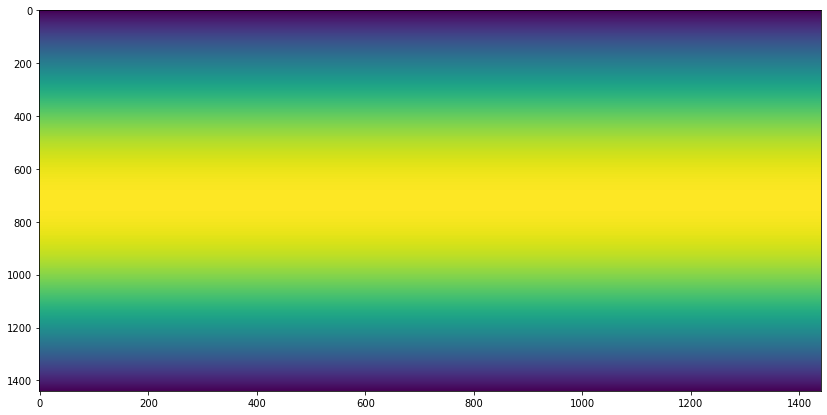

In [67]:
x_axis = [np.arange(-180, 180, 0.25)] # 0.25 cause 1440/4 = 360
y_axis = [np.arange(90, -90, -0.125)] # -0.5 cause 1440/8 = 180
xx, yy = np.meshgrid(x_axis, y_axis, indexing='xy')
print(np.shape(xx))

xy = np.array(list(zip(xx, yy)))
xy = np.moveaxis(xy, 1, -1) # reorder the axes
print(np.shape(xy))

# xy's shape is (1440, 1440, 2)
# 0th dimension: y on the albedo
# 1st dimension: x on the albedo
# 2nd dimension: [0: long, 1: lat]

distances3 = np.empty((1440, 1440, 2))

# traverse the entire albedo
for i in range(np.shape(xy)[0]-1): # y axis
    for j in range(np.shape(xy)[1]-1): # x axis
        # calculate pixel height in km using the pixel below the current one
        # reminder: haversine(lat1, lon1, lat2, lon2, radius)
        distances3[i, j, 1] = haversine(xy[i, j, 1], xy[i, j, 0], xy[i+1, j, 1], xy[i+1, j, 0], 2439.7)
        # calculate pixel width in km using the pixel to the right of the current one
        distances3[i, j, 0] = haversine(xy[i, j, 1], xy[i, j, 0], xy[i, j+1, 1], xy[i, j+1, 0], 2439.7)

# the method above fails to calculate values for the last row and last column
# we do that here:

# fixing the last row
for j in range(np.shape(xy)[1]): # x axis      
    distances3[-1, j, 1] = haversine(xy[-1, j, 1], xy[-1, j, 0], xy[-2, j, 1], xy[-2, j, 0], 2439.7)

# fixing the last column
for i in range(np.shape(xy)[0]): # y axis
    distances3[i, -1, 0] = haversine(xy[i, -1, 1], xy[i, -1, 0], xy[i, -2, 1], xy[i, -2, 0], 2439.7)

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(distances3[:,:,0], aspect='auto')

Defining the functions we need for lat dependent smoothing. I define `create_filter_2d_sep` again, in case we want to run only the mercury related celss of the notebook.

In [68]:
import math
radius = 3
sigma = 1

# diastances' shape is (360, 720, 2)
# 0th dimension: y on the albedo
# 1st dimension: x on the albedo
# 2nd dimension: [0: dist long, 1: dist lat]

def km_to_radius_x(y):
    '''Turns distances in km to distances in pixels'''
    # the reason this function is bounded to 1440 is that the values for radius
    # on the poles go to infinity and break the algorithm
    km = avgres1440['avgres'][y]
    distance = distances3[y, 5, 1]
    # print(y, km, distance)
    increment = int(km/distance) 
    # increment = increment if increment % 2 > 0 else increment + 1
    increment = int(increment/2.335)

    return increment if increment < 180 else 180


def create_filter_2d_sep(radius, sigma):
    '''Create a 2D gaussian filter using the separabily property of the Gaussian kernel'''
    gauss = np.empty([2*radius+1, 1])
    center = int(radius)
    
    for pixel in range(2*radius+1):
    # Create a 1D matrix which essentialy is the Gaussian blur in one dimension
        x = abs(center-pixel)
        gaussian = (1/(math.sqrt(2*math.pi*sigma**2))) * (math.e ** ((-x**2)/(2*(sigma**2))))
        gauss[pixel] = gaussian

    # Inner product of the matrix with its transpose is mathematically equivalent
    # to the 2D gaussian kernel but executes faster
    gauss2d = gauss @ gauss.T

    return gauss2d/np.sum(gauss2d)

A slightly different `adaptive_gauss` function. This time, the sigma is calculated based on our data and the radius is automatically calculated based on the value of sigma.

In [69]:
def adaptive_gauss(img):
    '''Adaptive gaussian blurring'''
    lat, lon = np.shape(img)
    fail = []
    radii = []
    sigmas = []

    alb_pad = np.flip(img, axis = 0)
    alb_pad = np.flip(alb_pad, axis = 1)
    padding = np.concatenate((alb_pad, alb_pad, alb_pad), axis=1)

    layer2 = np.concatenate((img, img, img), axis=1)

    alb = np.concatenate((padding, layer2, padding), axis=0)

    xpad = lon
    ypad = lat

    for y in range(ypad, ypad+lat):
        sigma = km_to_radius_x(y-ypad)
        radius = (2 * sigma) + 1
        # print(y-ypad, radius)
        # print("Radius: " + repr(radius))
        radii.append(radius)
        sigmas.append(sigma)
        filter = create_filter_2d_sep(radius, sigma)

        for x in range(xpad, xpad+lon):

            # general case
            uplim = y-radius
            downlim = y+radius+1
            leftlim = x-radius
            rightlim = x+radius+1

            fuplim = 0
            fdownlim = 2*radius+1
            fleftlim = 0
            frightlim = 2*radius+1         

            a = alb[uplim:downlim, leftlim:rightlim]
            b = filter[fuplim:fdownlim, fleftlim:frightlim]
            try:
                img[y-ypad, x-xpad] = np.sum(np.multiply(a, b))
            except Exception as e:
                if y not in fail: fail.append(y)
                print(e)
                # print(y, x)

    if fail: print(fail)
    return img, radii, sigmas       

This is how the full Mercury albedo looks before applying blurring:

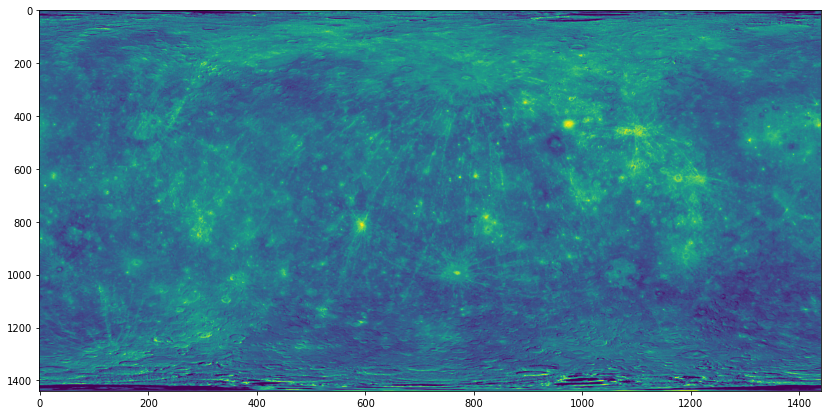

In [70]:
testmap = fullmerc.copy()

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(testmap, aspect='auto')

In [71]:
adapted, radii, sigmas = adaptive_gauss(testmap)

We apply Gaussian blurring based on the latitude dependent average spatial resolution data we have from Mercury's element maps. The result is this:

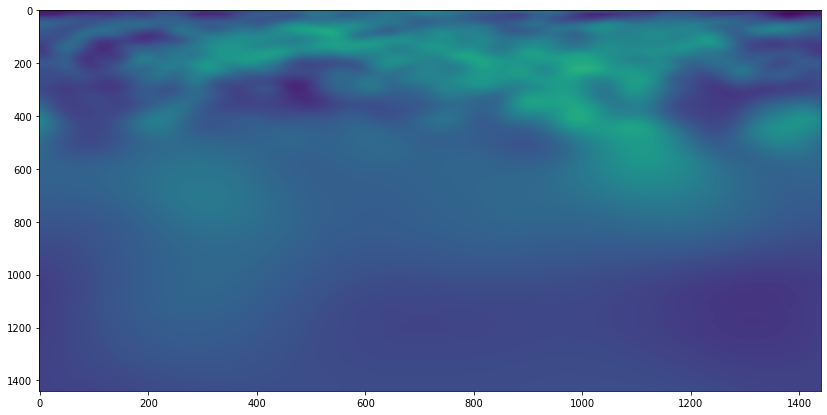

In [72]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(adapted, aspect='auto')

We observe how the radii and the sigmas change depending on the latitude:

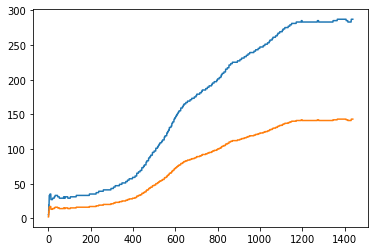

In [73]:
plt.plot(radii)
plt.plot(sigmas)

We plot the average color per row of pixels before and after the smoothing:

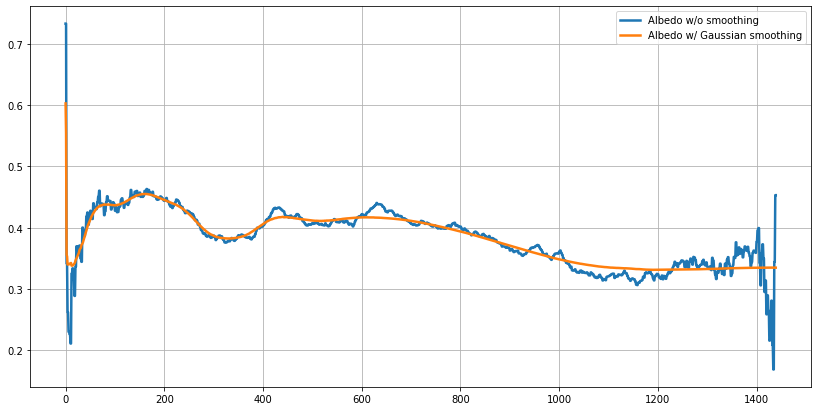

In [74]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.plot([x.mean() for x in fullmerc[:][:]], linewidth=2.5)
ax.plot([x.mean() for x in adapted[:][:]], linewidth=2.5)
ax.legend(["Albedo w/o smoothing", "Albedo w/ Gaussian smoothing"])
ax.grid()

In [75]:
def adaptive_gauss(img):
    '''Adaptive gaussian blurring'''
    lat, lon = np.shape(img)
    fail = []

    alb_pad = np.flip(img, axis = 0)
    alb_pad = np.flip(alb_pad, axis = 1)
    padding = np.concatenate((alb_pad, alb_pad, alb_pad), axis=1)

    layer2 = np.concatenate((img, img, img), axis=1)

    alb = np.concatenate((padding, layer2, padding), axis=0)

    xpad = lon
    ypad = lat

    ratio = len(sigmas)/lat

    for y in range(ypad, ypad+lat):
        idx = int((y-lat)*ratio)
        sigma = sigmas[idx]
        radius = radii[idx]
        # print(y-ypad, radius)
        # print("Radius: " + repr(radius))
        filter = create_filter_2d_sep(radius, sigma)

        for x in range(xpad, xpad+lon):

            # general case
            uplim = y-radius
            downlim = y+radius+1
            leftlim = x-radius
            rightlim = x+radius+1

            fuplim = 0
            fdownlim = 2*radius+1
            fleftlim = 0
            frightlim = 2*radius+1         

            a = alb[uplim:downlim, leftlim:rightlim]
            b = filter[fuplim:fdownlim, fleftlim:frightlim]
            try:
                img[y-ypad, x-xpad] = np.sum(np.multiply(a, b))
            except Exception as e:
                if y not in fail: fail.append(y)
                print(e)
                # print(y, x)

    if fail: print(fail)
    return img    

On the Moon's Albedo, we apply Gaussian blurring based on the latitude dependent average spatial resolution data we have from Mercury's element maps. The result is this:

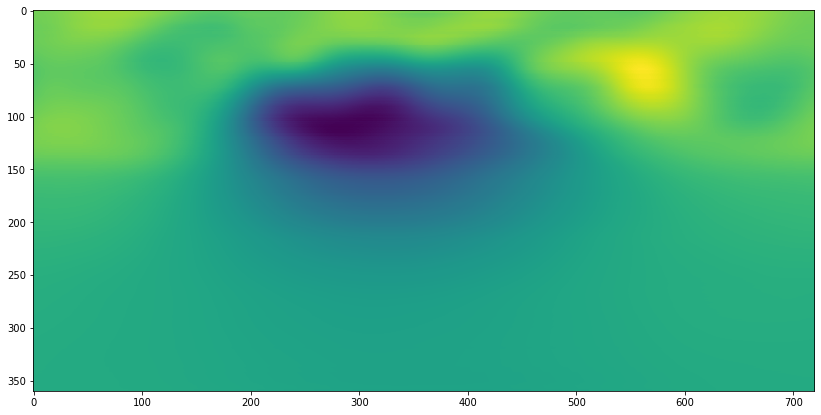

In [76]:
albedotest = albedo.copy()

albdtest = adaptive_gauss(albedotest)

fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(albdtest, aspect='auto')

We apply the same blurring to the Lunar element maps.

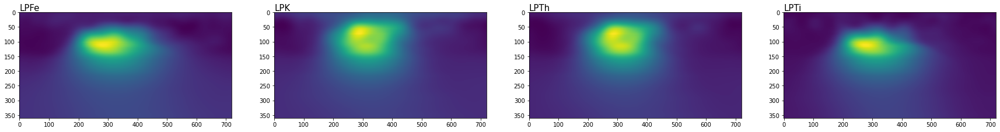

In [77]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))
blurred_elements = []

for m in range(len(maps)):

    moonmap = moon[maps[m]].copy()
    moonmap = adaptive_gauss(moonmap)
    blurred_elements.append(moonmap)

    axs[m].imshow(moonmap) # display the map
    axs[m].text(0, -5, maps[m], fontsize=15) # display a label over the map

plt.show()

We apply the 2 masks we generated earlier to the lunar element data. This creates "Mooncury".

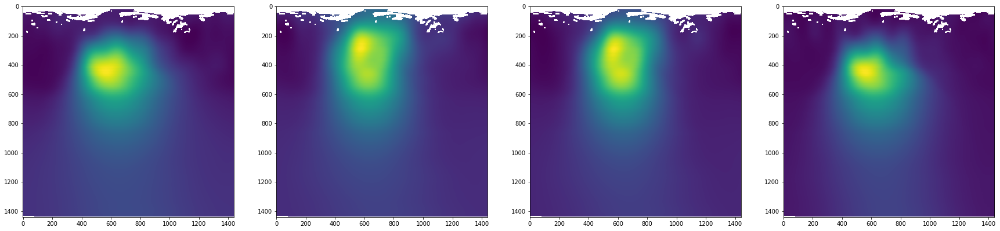

In [78]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))

for m in range(len(maps)):
    mapp = np.repeat(blurred_elements[m], 2, axis=1)
    mapp = np.repeat(mapp, 4, axis=0)
    axs[m].imshow(np.ma.array(mapp, mask = final_mask_and_full)) # display the map

plt.show()

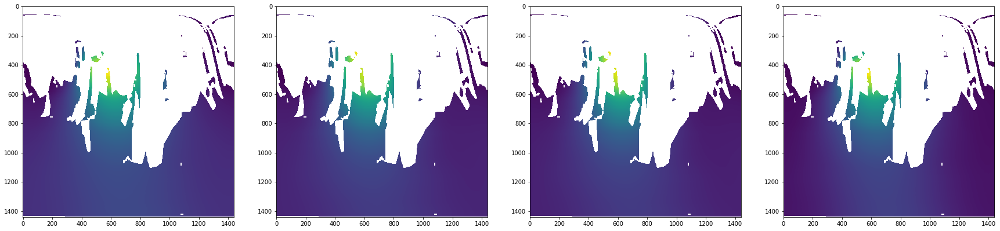

In [79]:
maps = ['LPFe', 'LPK', 'LPTh', 'LPTi'] # the maps we care about

fig, axs = plt.subplots(1, len(maps), figsize=(30, 10))
blurred_elements_masked = []

for m in range(len(maps)):
    mapp = np.repeat(blurred_elements[m], 2, axis=1)
    mapp = np.repeat(mapp, 4, axis=0)
    mapp = np.ma.array(mapp, mask = final_mask_or_full)
    blurred_elements_masked.append(mapp)

    axs[m].imshow(np.ma.array(mapp, mask = final_mask_or_full)) # display the map

plt.show()

The maps above look similar but we can easily check and see that they are not:

In [80]:
np.array_equal(blurred_elements_masked[0].data, blurred_elements_masked[1].data)

False

Now, we'll split the images into training and test datasets in order to apply ML. Essentially, each image is split into two parts: the pixels where we have no data (masked parts) and the pixels where we have available data.

We train on the parts where we have data (using the parts of the albedo that are unmasked in order to predict the parts of the element maps that are unmasked) and we predict the parts of the element maps that have no data (masked parts) using the equivalent "masked" region of the albedo.

In [81]:
albdtest = np.repeat(albdtest, 2, axis=1)
albdtest = np.repeat(albdtest, 4, axis=0)

albdtestm = np.ma.array(albdtest, mask = final_mask_or_full)

In [82]:
data = albdtestm.data.flatten()
mask = albdtestm.mask.flatten()
yesdata = [] # the parts of the image where we have data
nodata = [] # the parts of the image where we don't have any data
l = len(data)

for i in range(l):
    if mask[i]: nodata.append(data[i])
    else: yesdata.append(data[i])

yesmappps = []
nomappps = []
for bem in range(len(blurred_elements_masked)):
    data = blurred_elements_masked[bem].data.flatten()
    mask = blurred_elements_masked[bem].mask.flatten()
    ydata = []
    ndata = []
    for i in range(l):
        if mask[i]: ndata.append(data[i])
        else: ydata.append(data[i])
    yesmappps.append(ydata)
    nomappps.append(ndata)

Checking the sizes of the produced lists in order to verify we that the size of `yesdata` is consistent across all maps.

In [83]:
print(np.shape(yesdata))
print(np.shape(nodata))

(1160146,)
(913454,)


In [84]:
print(np.shape(yesmappps))
print(np.shape(nomappps))

(4, 1160146)
(4, 913454)


In [85]:
np.array_equal(yesmappps[0], yesmappps[1])

False

We apply ML, first on "Mooncury":

In [86]:
import xgboost as xgb 

preds = []

for i in range(4):
    xgb_reg = xgb.XGBRegressor(learning_rate = 0.1, n_estimators = 30, max_depth = 5)

    X_train = pd.DataFrame(yesdata)
    y_train = pd.DataFrame(yesmappps[i])

    xgb_reg.fit(X_train, y_train)

    X_test = pd.DataFrame(nodata)
    y_test = pd.DataFrame(nomappps[i])

    pred = xgb_reg.predict(X_test)
    preds.append(pred)

[03:30:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[03:30:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[03:31:02] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[03:31:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


We reconstruct the images:

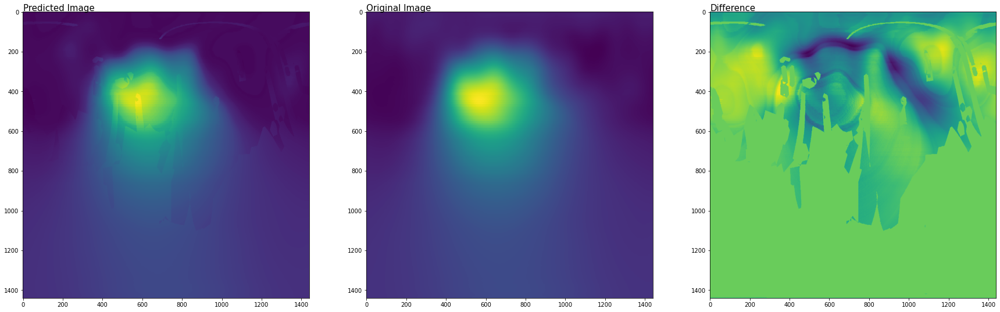

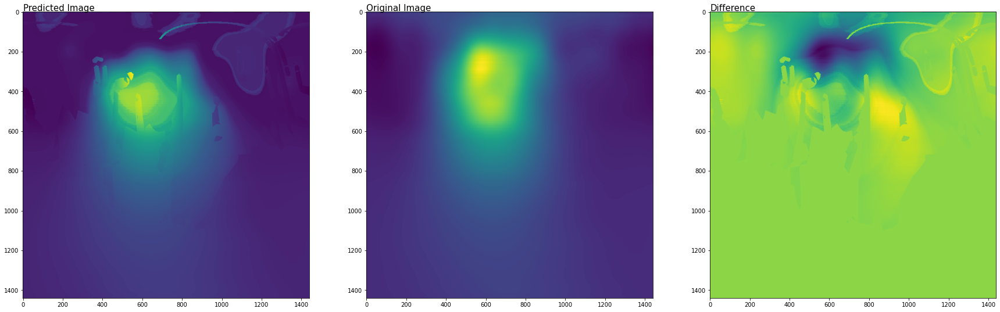

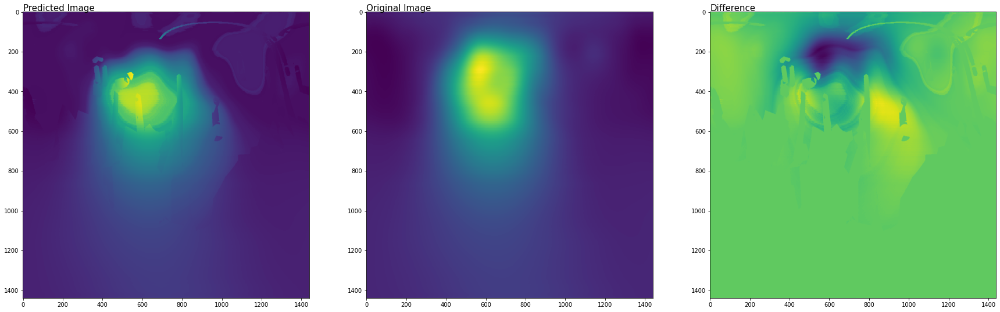

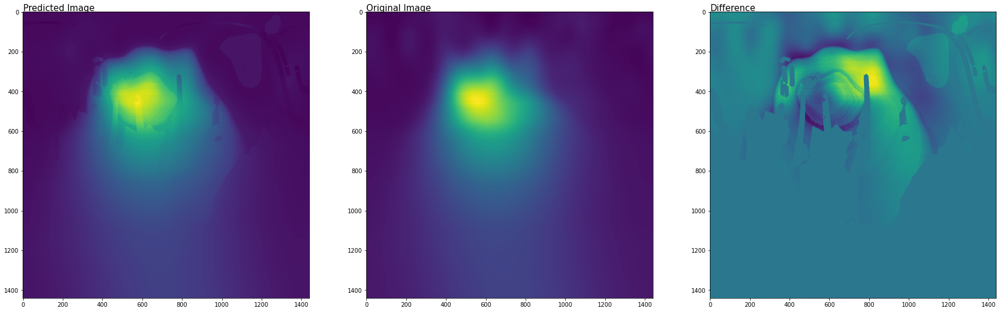

In [87]:
results = []

for p in range(len(preds)):
    img = []
    yescount = 0
    nocount = 0

    for i in range(l):
        if mask[i]: 
            img.append(preds[p][nocount])
            nocount += 1
        else: 
            img.append(yesmappps[p][yescount])
            yescount += 1

    img = np.reshape(img, (1440, 1440))
    results.append(img)

    fig, ax = plt.subplots(1, 3, figsize=(30, 14))
    ax[0].imshow(img)
    ax[0].text(0, -5, "Predicted Image", fontsize=15)
    blr = np.repeat(blurred_elements[p], 2, axis=1)
    blr = np.repeat(blr, 4, axis=0)
    ax[1].imshow(blr)
    ax[1].text(0, -5, "Original Image", fontsize=15)
    ax[2].imshow(img-blr)
    ax[2].text(0, -5, "Difference", fontsize=15)
    plt.show()

Now, we repeat the process for Mercury:

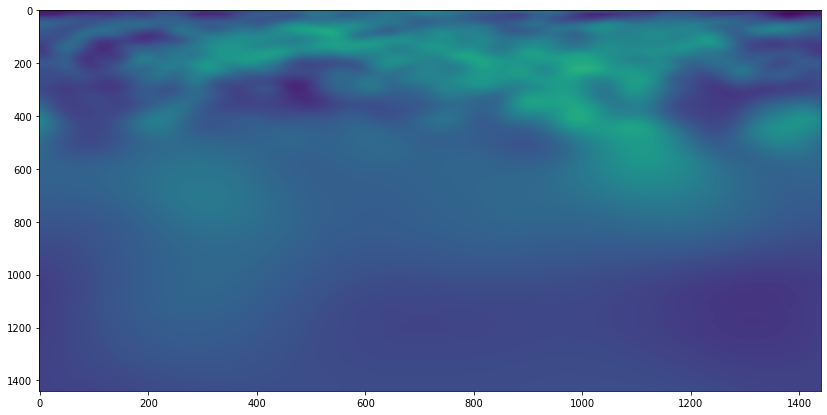

In [88]:
fig, ax = plt.subplots(figsize=(14, 7))
ax.imshow(adapted, aspect='auto')

In [89]:
maps = ['mgsimap', 'alsimap', 'ssimap', 'fesimap', 'casimap']
mercmaps = []

for m in maps:
    mercmaps.append(mercury[m])

In [90]:
import xgboost as xgb 

predsmerc = []
merctrain = adapted.flatten()

for i in range(5):

    elmap = np.repeat(mercmaps[i], 2, axis=0)
    elmap = elmap.flatten()
    
    X_train = []
    X_test = []
    y_train = []

    for i in range(len(merctrain)):
        if elmap[i]: 
            X_train.append(merctrain[i])
            y_train.append(elmap[i])
        else: 
            X_test.append(merctrain[i])


    xgb_reg = xgb.XGBRegressor(learning_rate = 0.1, n_estimators = 30, max_depth = 5)

    X_train = pd.DataFrame(X_train)
    y_train = pd.DataFrame(y_train)

    xgb_reg.fit(X_train, y_train)

    X_test = pd.DataFrame(X_test)

    pred = xgb_reg.predict(X_test)
    predsmerc.append(pred)

[03:31:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[03:32:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[03:32:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[03:32:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[03:33:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


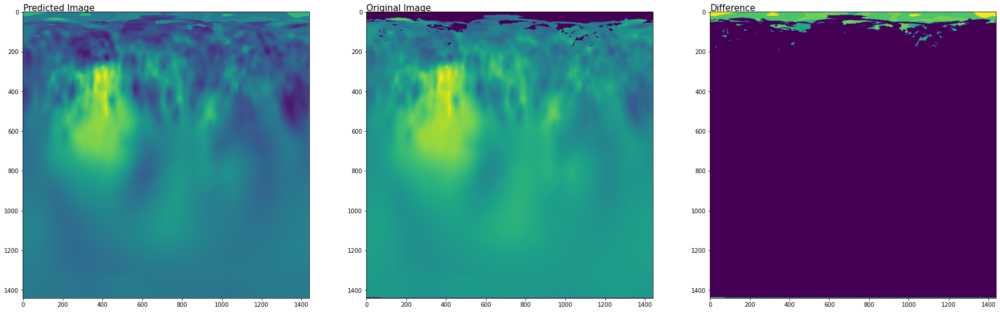

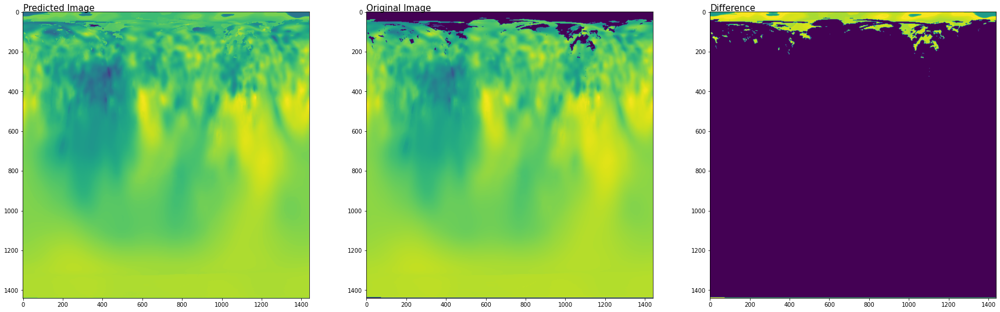

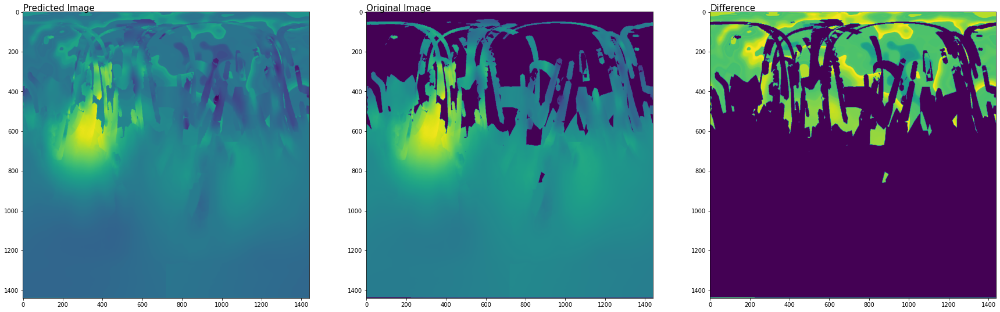

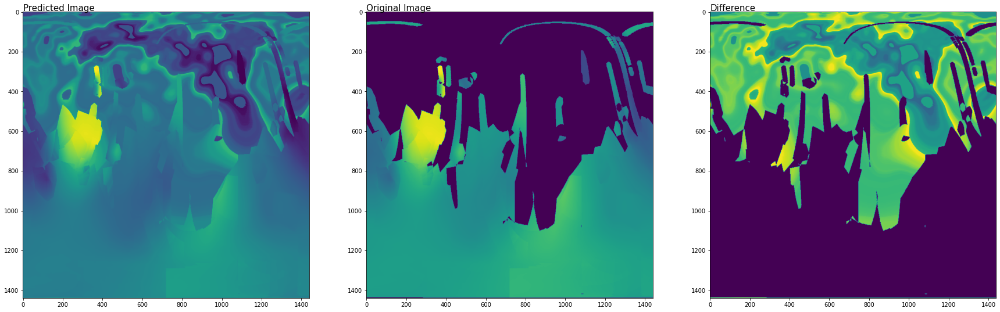

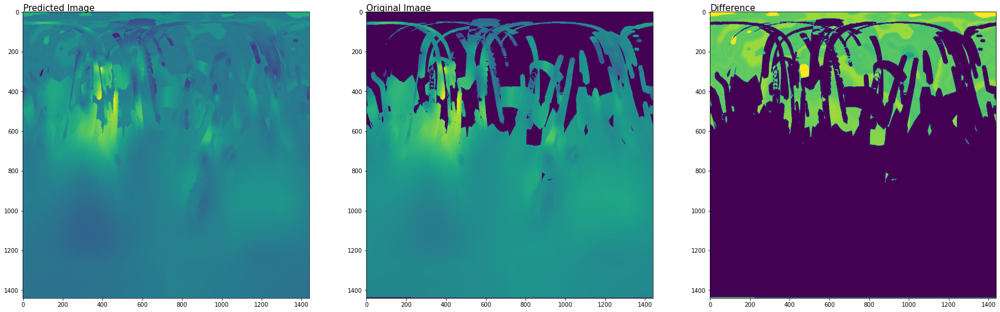

In [91]:
results = []

for p in range(len(predsmerc)):
    img = []
    yescount = 0
    nocount = 0

    elmap = np.repeat(mercmaps[p], 2, axis=0)
    elmap = elmap.flatten()

    for i in range(len(merctrain)):
        if elmap[i] != 0: 
            img.append(elmap[i])
        else:             
            img.append(predsmerc[p][nocount])
            nocount += 1
            
    img = np.reshape(img, (1440, 1440))
    results.append(img)

    fig, ax = plt.subplots(1, 3, figsize=(30, 14))
    ax[0].imshow(img)
    ax[0].text(0, -5, "Predicted Image", fontsize=15)
    blr = np.repeat(mercmaps[p], 2, axis=0)
    ax[1].imshow(blr)
    ax[1].text(0, -5, "Original Image", fontsize=15)
    ax[2].imshow(img-blr)
    ax[2].text(0, -5, "Difference", fontsize=15)
    plt.show()